![image](https://docs.google.com/uc?export=download&id=1NUy1Q-abpoV9XYK9qT9t8Mdhj3ZVlveO)

<table align="center">
  <td>
    <a href="https://colab.research.google.com/github/jpcano1/MINE_4210_Analisis_con_Deep_Learning/blob/master/lab_5/practica_11.ipynb" target="_blank"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/>
  </td>
</table>

# **Práctica 11**

# **Redes Generativas Adeversarias**
# **Objetivos**
- Entender de forma superficial el uso de PyTorch
- Introducirnos al uso de GANs y de DCGANs


In [ ]:
!shred -u setup_colab_general.py
!wget -q "https://github.com/jpcano1/python_utils/raw/main/setup_colab_general.py" -O setup_colab_general.py
import setup_colab_general as setup_general
setup_general.setup_general()

shred: setup_colab_general.py: failed to open for writing: No such file or directory


  0%|          | 0/3 [00:00<?, ?KB/s]

General Functions Enabled Successfully


In [ ]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
plt.style.use("seaborn-deep")
import seaborn as sns

import torch
from torch import nn

from utils import general as gen

from tqdm.auto import tqdm

from torchvision import transforms
from torchvision.datasets import MNIST
from torchvision.utils import make_grid
from torch.utils.data import DataLoader

from typing import Tuple, List, Optional, Any

torch.manual_seed(1234)

In [ ]:
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
BATCH_SIZE = 64

In [ ]:
class Generator(nn.Module):
    '''
    Generator Class
    '''
    def __init__(
        self, z_dim: int = 10, output_channels: int = 1, 
        hidden_dim: int = 64,
    ) -> None:
        """
        :param z_dim: Dimension of the noise vector
        :type z_dim: int
        :param output_channels: The number of channels 
        in the generated images
        :type output_channels: int
        :param hidden_dim: The inner dimensions
        :type hidden_dim: int
        """
        super(Generator, self).__init__()
        self.z_dim = z_dim
        # Build the neural network
        self.gen = nn.Sequential(
            self.make_gen_block(z_dim, hidden_dim * 4),
            self.make_gen_block(
                hidden_dim * 4, 
                hidden_dim * 2, 
                kernel_size=4, 
                stride=1,
            ),
            self.make_gen_block(
                hidden_dim * 2, 
                hidden_dim,
            ),
            self.make_gen_block(
                hidden_dim, 
                output_channels,
                kernel_size=4,
                final_layer=True,
            ),
        )

    def make_gen_block(
        self, input_channels: int, output_channels: int, 
        kernel_size: int = 3, stride: int = 2, 
        final_layer: bool = False,
    ) -> nn.Sequential:
        '''
        Function that creates a deconvolutional block for the generator
        :param input_channels: The number of input
        channels for the conv layer
        :type input_channels: int
        :param output_channels: The number of output 
        channels for the conv layer
        :type output_channels: int
        :param stride: The size of the stride pass of the kernel
        :type stride: int
        :param final_layer: A flag that indicates whether a 
        layer is the last or is a hidden
        :type final_layer: bool
        :return: A Sequential that contains the deconvolution, 
        the normalization and the activation layer
        :rtype: nn.Sequential
        '''
        # Build the neural block
        if not final_layer:
            return nn.Sequential(
                nn.ConvTranspose2d(
                    input_channels, output_channels, 
                    kernel_size=kernel_size, stride=stride,
                ),
                nn.BatchNorm2d(output_channels),
                nn.ReLU(),
            )
        # Final Layer
        else:
            return nn.Sequential(
                nn.ConvTranspose2d(
                    input_channels, output_channels, 
                    kernel_size=kernel_size, stride=stride,
                ),
                nn.Sigmoid(),
            )

    def unsqueeze_noise(self, noise: torch.Tensor) -> torch.Tensor:
        '''
        Function that reshapes a noise tensor, 
        given a tensor of shape (batch_size, z_dim), 
        returns the tensor with dimensions (batch_size, z_dim, 1, 1). 
        With 1 as the height and width
        :param noise: The noise tensor
        :type noise: torch.Tensor
        :return: The tensor reshaped
        :rtype: torch.Tensor
        '''
        return noise.view(len(noise), self.z_dim, 1, 1)

    def forward(self, noise: torch.Tensor) -> torch.Tensor:
        '''
        Forward pass
        :param noise: The noise tensor
        :type noise: torch.Tensor
        :return: The image generated
        :rtype: torch.Tensor
        '''
        x = self.unsqueeze_noise(noise)
        return self.gen(x)

def get_noise(n_samples: int, z_dim: int) -> torch.Tensor:
    """
    Creates the noise vector of random numbers 
    with normal distribution with shape (n_samples, z_dim)
    :param n_samples: The number of samples
    :type n_samples: int
    :param z_dim: The dimension of the noise vector
    :type z_dim: int
    :return: The tensor of random_numbers generated
    """
    return torch.randn(n_samples, z_dim, device=DEVICE)

In [ ]:
class Discriminator(nn.Module):
    '''
    Discriminator Class
    '''
    def __init__(
        self, init_channels: int = 1,
        hidden_dim: int = 16,
    ) -> None:
        """
        :param init_channels: The input channels 
        from the image to be classified
        :type init_channels: int
        :param hiddem_dim: The inner dimensions
        :type hidden_dim: int
        """
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            self.make_disc_block(init_channels, hidden_dim),
            self.make_disc_block(hidden_dim, hidden_dim * 2),
            self.make_disc_block(hidden_dim * 2, 1, final_layer=True),
        )

    def make_disc_block(
        self, input_channels: int, output_channels: int, 
        kernel_size: int = 4, stride: int = 2, 
        final_layer: bool = False,
    ) -> nn.Sequential:
        '''
        Function that creates a convolutional block for the discriminator
        :param input_channels: The number of input channels
        :type input_channels: int
        :param output_channels: The number of output channels
        :type output_channels: int
        :param kernel_size: The size of the kernel
        :type kernel_size: int
        :param stride: The size of the stride pass
        :type stride: int
        :param final_layer: A flag that indicates whether a 
        layer is the last or is a hidden
        :type final_layer: bool
        :return: A Sequential that contains the convolution, 
        the normalization and the activation layer
        :rtype: nn.Sequential
        '''
        # Build the neural block
        if not final_layer:
            return nn.Sequential(
                nn.Conv2d(
                    input_channels, output_channels, 
                    kernel_size=kernel_size, stride=stride,
                ),
                nn.BatchNorm2d(output_channels),
                nn.LeakyReLU(0.2),
            )
        else: # Final Layer
            return nn.Sequential(
                nn.Conv2d(
                    input_channels, output_channels, 
                    kernel_size=kernel_size, stride=stride,
                ),
                nn.Sigmoid(),
            )

    def forward(self, image: torch.Tensor) -> torch.Tensor:
        '''
        Forward pass
        :param image: The image to be classified as real or fake
        :type image: torch.Tensor
        :return: The image classified
        :rtype: torch.Tensor
        '''
        disc_pred = self.disc(image)
        return disc_pred.view(len(disc_pred), -1)

In [ ]:
criterion = nn.BCELoss()
z_dim = 64
display_step = 500

beta_1 = 0.5 
beta_2 = 0.999
lr = 2e-4

transform = transforms.Compose([
    transforms.ToTensor(),
])

dataloader = DataLoader(
    MNIST(".", download=True, transform=transform),
    batch_size=BATCH_SIZE,
    shuffle=True,
)

  0%|          | 0/9912422 [00:00<?, ?it/s]

Extracting ./MNIST/raw/train-images-idx3-ubyte.gz to ./MNIST/raw



  0%|          | 0/28881 [00:00<?, ?it/s]

Extracting ./MNIST/raw/train-labels-idx1-ubyte.gz to ./MNIST/raw



  0%|          | 0/1648877 [00:00<?, ?it/s]

Extracting ./MNIST/raw/t10k-images-idx3-ubyte.gz to ./MNIST/raw



  0%|          | 0/4542 [00:00<?, ?it/s]

Extracting ./MNIST/raw/t10k-labels-idx1-ubyte.gz to ./MNIST/raw



In [ ]:
generator = Generator(z_dim).to(DEVICE)
gen_opt = torch.optim.Adam(
    generator.parameters(), 
    lr=lr, 
    betas=(beta_1, beta_2),
)
discriminator = Discriminator().to(DEVICE) 
disc_opt = torch.optim.Adam(
    discriminator.parameters(), 
    lr=lr, 
    betas=(beta_1, beta_2),
)

In [ ]:
def get_tensor_images(
    image_tensor: torch.Tensor,
    num_images: int = 25,
    size: Tuple[int] = (1, 28, 28),
) -> torch.Tensor:
    '''
    Function for visualizing images: Given a tensor of 
    images, number of images, and size per image, plots 
    and prints the images in an uniform grid.
    :param image_tensor: The batch of images generated 
    or from the dataset
    :type image_tensor: torch.Tensor
    :param num_images: The number of images per grid
    :type num_images: int
    :param size: The input size of the image
    :type: Tuple[int]
    :return: The grid generated for the image batch
    :rtype: torch.Tensor
    '''
    image_unflat = image_tensor.detach().cpu()
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    return image_grid.permute(1, 2, 0).squeeze()

In [ ]:
def train(
    generator: Generator, discriminator: Discriminator,
    n_epochs: int, dataset: DataLoader, 
    criterion: nn.Module, disc_opt: torch.optim.Optimizer, 
    gen_opt: torch.optim.Optimizer, z_dim: int = 100,
) -> None:
    """
    Function to train the GAN
    :param generator: The generator part
    :type generator: Generator
    :param discriminator: The discriminator part
    :type discriminator: Discriminator
    :param n_epochs: The number of epochs to train
    :type n_epochs: int
    :param dataset: The dataset to fit the network
    :type dataset: DataLoader
    :param criterion: The loss function
    :type criterion: nn.Module
    :param disc_opt: The optimizer of the discriminator
    :type disc_opt: torch.optim.Optimizer
    :param gen_opt: The optimizer of the generator
    :type gen_output: torch.optim.Optimizer
    :param z_dim: The dimension of the noise vector
    :type z_dim: int
    """
    cur_step = 0
    for epoch in range(n_epochs):
        bar = tqdm(dataloader)
        bar.set_description(f"Epoch {epoch + 1}/{n_epochs}")
        status = {}
        for real_images, _ in bar:
            real_images = real_images.to(DEVICE)

            # Sets gradients to zero
            disc_opt.zero_grad()
            noise = get_noise(BATCH_SIZE, z_dim)
            fake_images = generator(noise)
            
            # Predict the classification for fake generated images
            fake_pred = discriminator(fake_images.detach())
            fake_loss = criterion(fake_pred, torch.zeros_like(fake_pred))

            # Predict the classification for real images
            real_pred = discriminator(real_images)
            real_loss = criterion(real_pred, torch.ones_like(real_pred))

            status["disc_real_loss"] = real_loss.item()
            status["disc_fake_loss"] = fake_loss.item()

            # Backpropagate losses and apply the Adam optimizer
            disc_loss = (real_loss + fake_loss) / 2
            disc_loss.backward(retain_graph=True)
            disc_opt.step()

            # Sets gradients to zero
            gen_opt.zero_grad()
            noise = get_noise(BATCH_SIZE, z_dim)
            fake_images = generator(noise)
            # Predict the classification for fake generated images
            fake_pred = discriminator(fake_images)
            # Calculate the loss of the fake images w.r.t the discriminator
            gen_loss = criterion(fake_pred, torch.ones_like(fake_pred))
            # Backpropagate losses to generator.
            gen_loss.backward()
            gen_opt.step()

            status["gen_loss"] = gen_loss.item()

            bar.set_postfix(status)

            if cur_step % display_step == 0 and cur_step > 0:
                fake_grid = get_tensor_images(fake_images)
                real_grid = get_tensor_images(real_images)
                gen.visualize_subplot(
                    [fake_grid, real_grid],
                    ["Fake Images", "Real Images"], (1, 2), 
                    (12, 6),
                )
                plt.show()
            cur_step += 1

  0%|          | 0/938 [00:00<?, ?it/s]

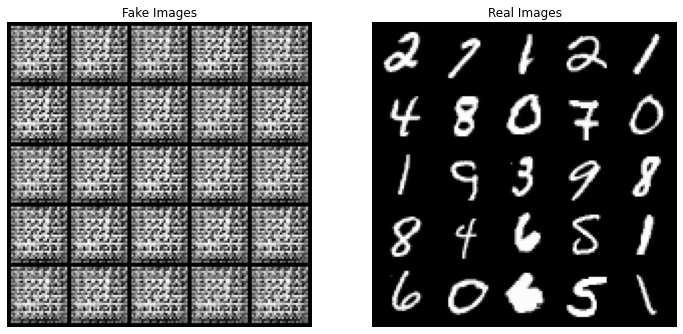

  0%|          | 0/938 [00:00<?, ?it/s]

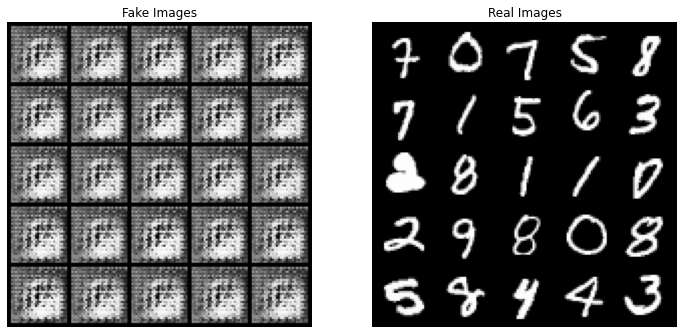

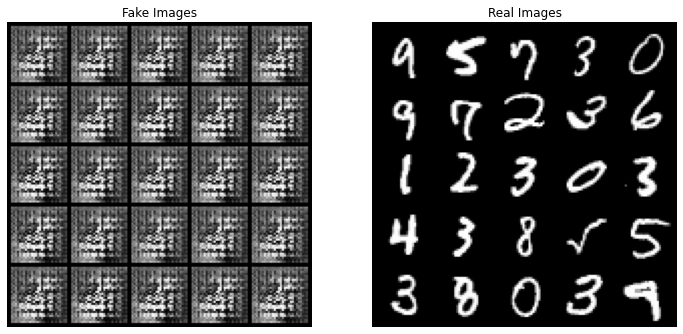

  0%|          | 0/938 [00:00<?, ?it/s]

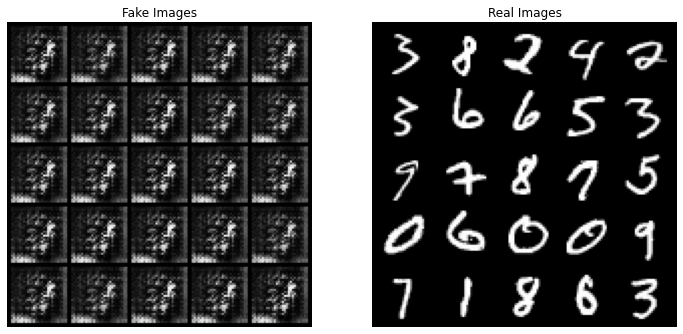

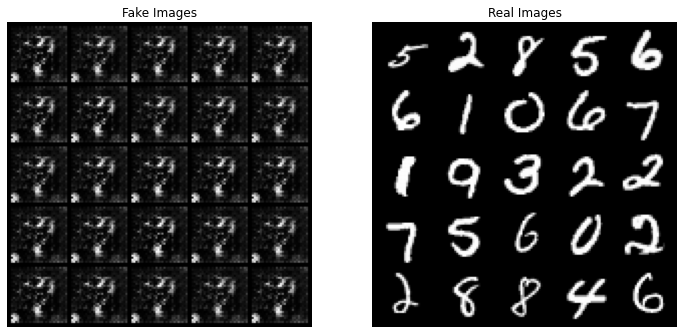

  0%|          | 0/938 [00:00<?, ?it/s]

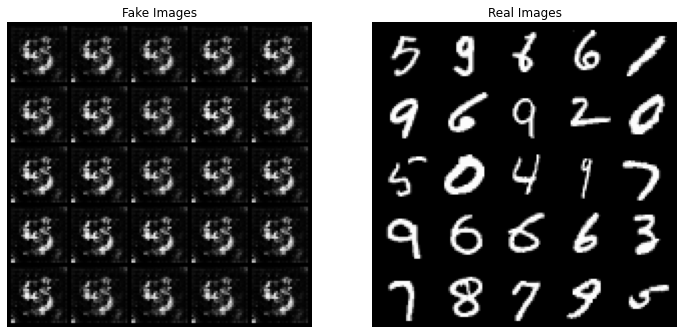

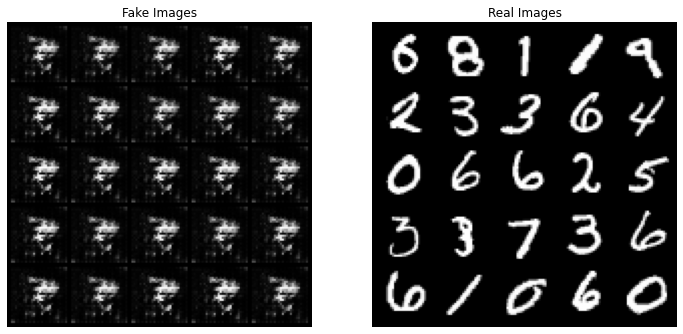

  0%|          | 0/938 [00:00<?, ?it/s]

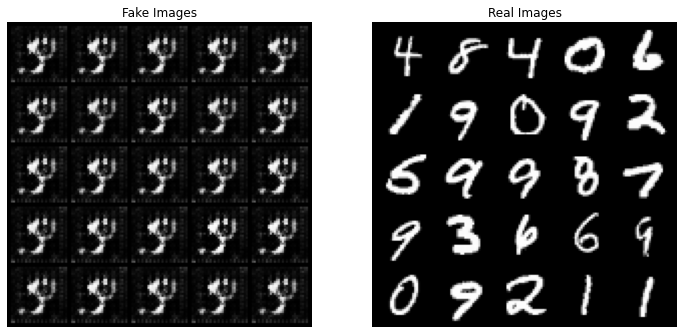

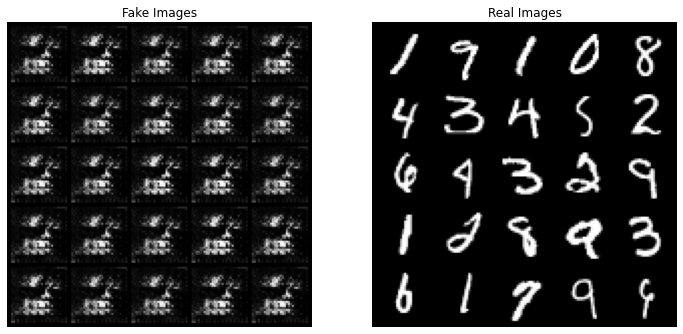

  0%|          | 0/938 [00:00<?, ?it/s]

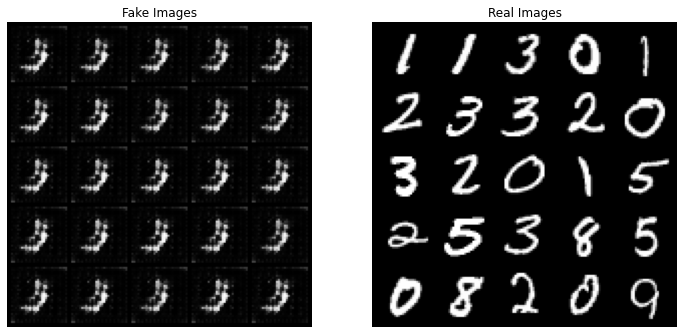

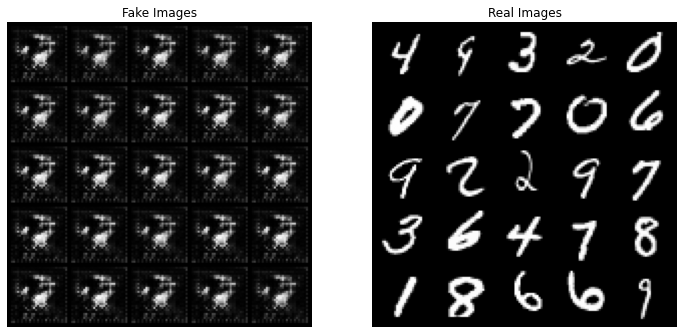

  0%|          | 0/938 [00:00<?, ?it/s]

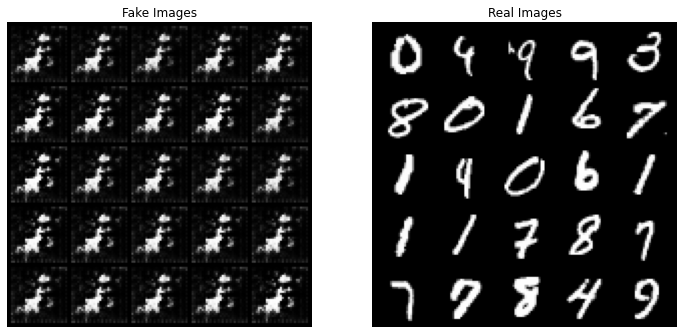

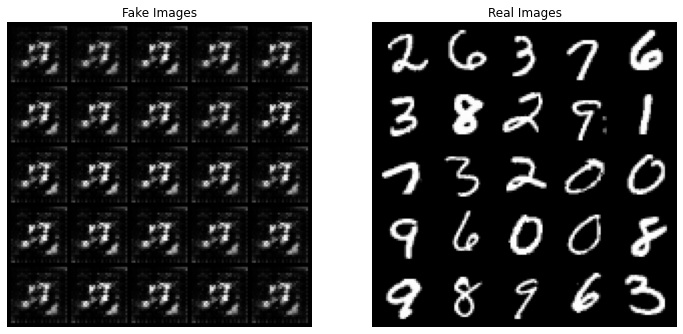

  0%|          | 0/938 [00:00<?, ?it/s]

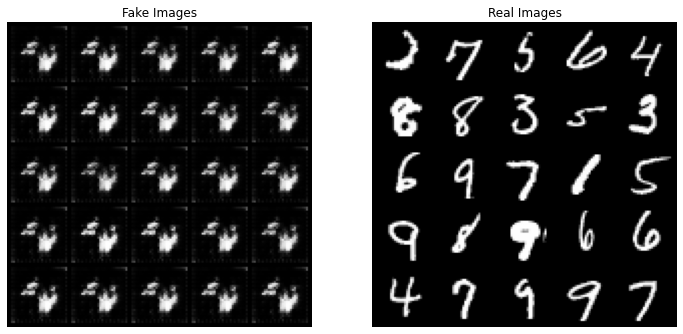

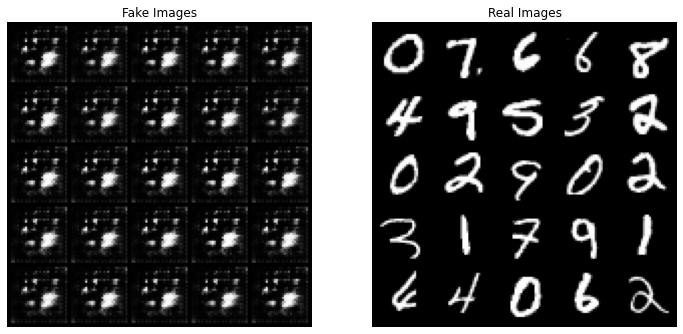

  0%|          | 0/938 [00:00<?, ?it/s]

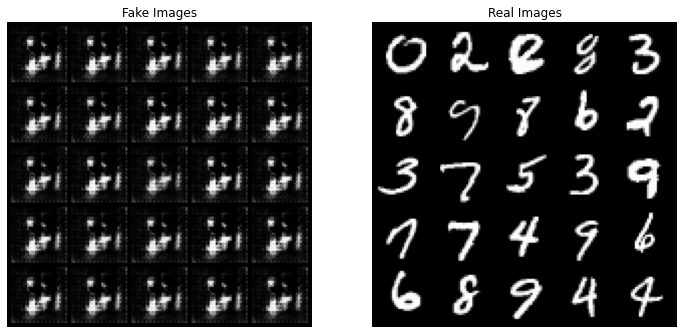

  0%|          | 0/938 [00:00<?, ?it/s]

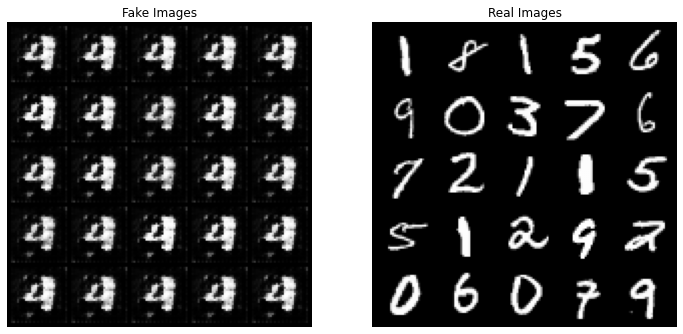

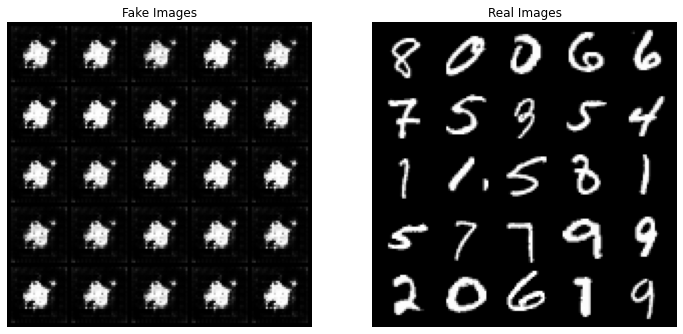

  0%|          | 0/938 [00:00<?, ?it/s]

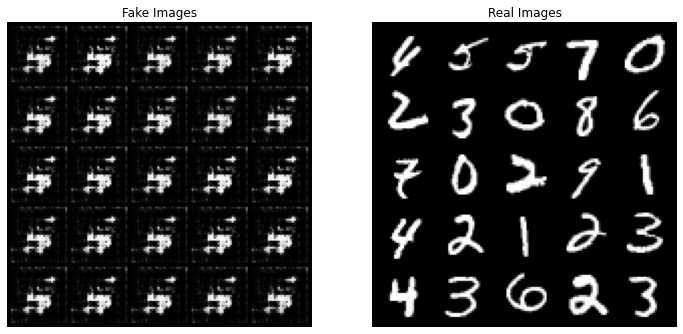

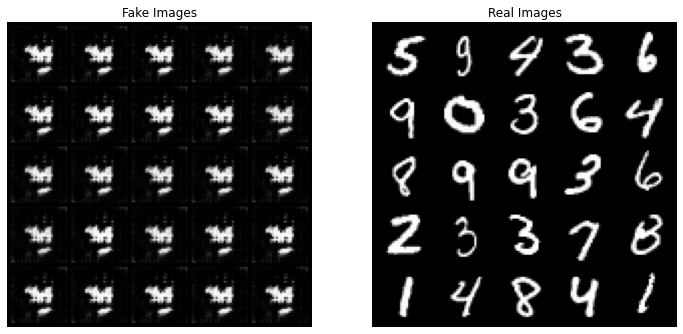

  0%|          | 0/938 [00:00<?, ?it/s]

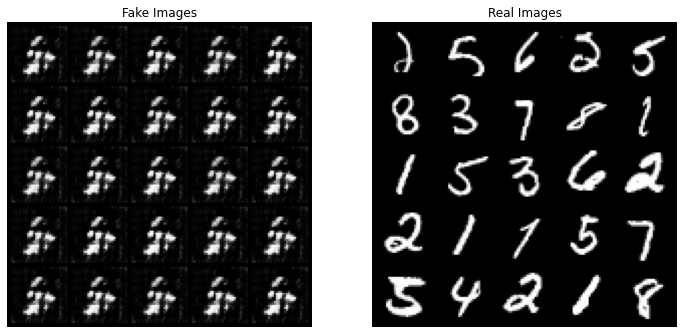

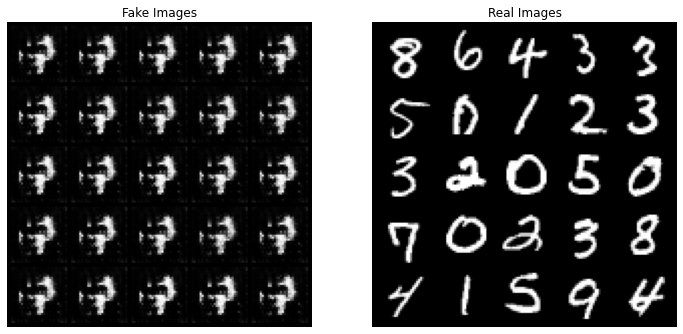

  0%|          | 0/938 [00:00<?, ?it/s]

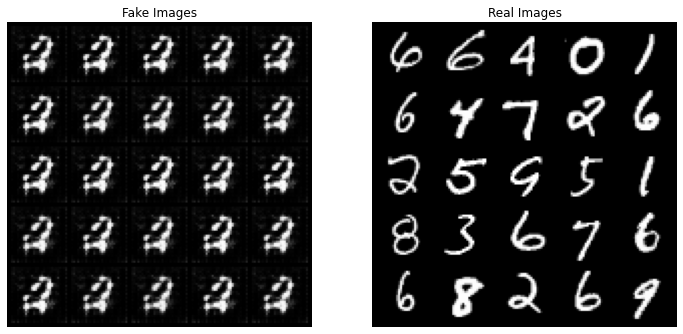

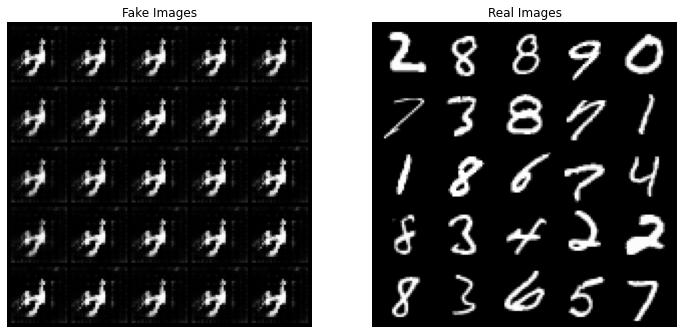

  0%|          | 0/938 [00:00<?, ?it/s]

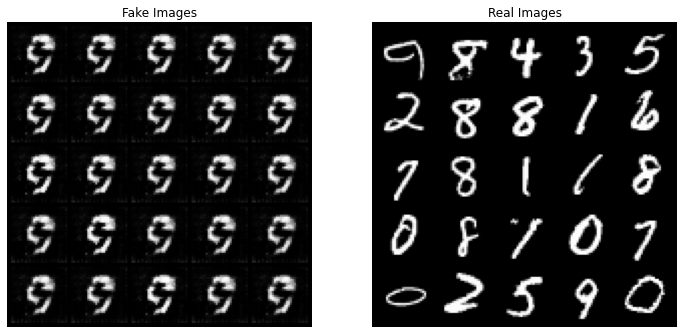

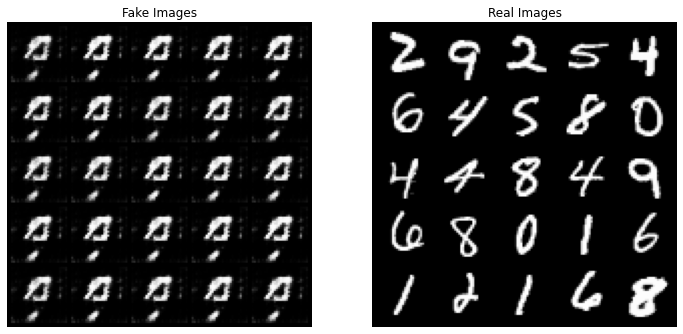

  0%|          | 0/938 [00:00<?, ?it/s]

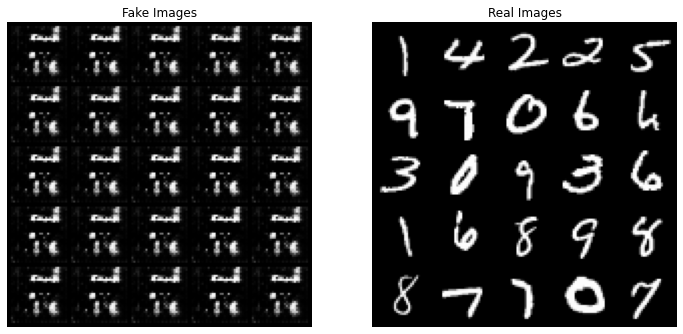

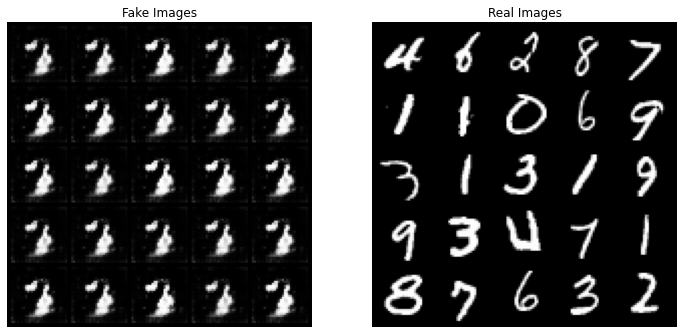

  0%|          | 0/938 [00:00<?, ?it/s]

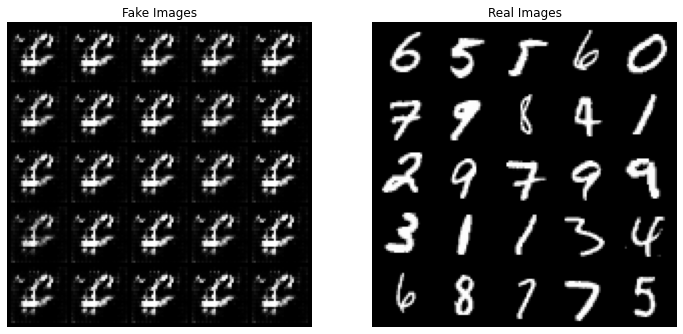

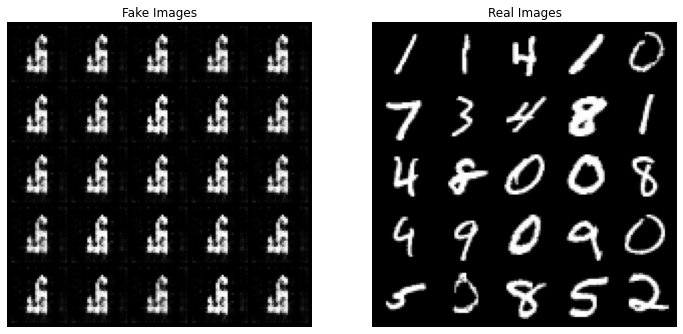

  0%|          | 0/938 [00:00<?, ?it/s]

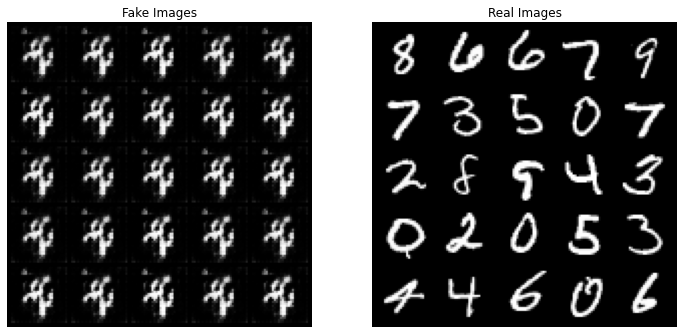

  0%|          | 0/938 [00:00<?, ?it/s]

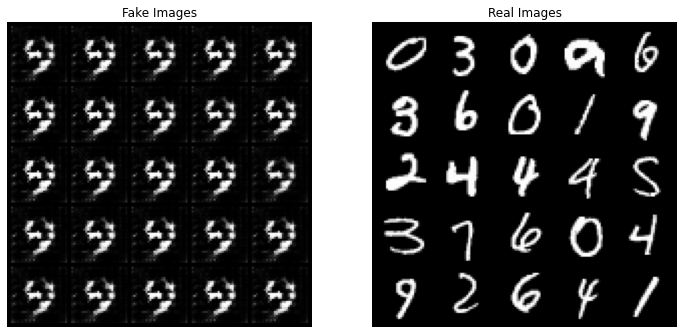

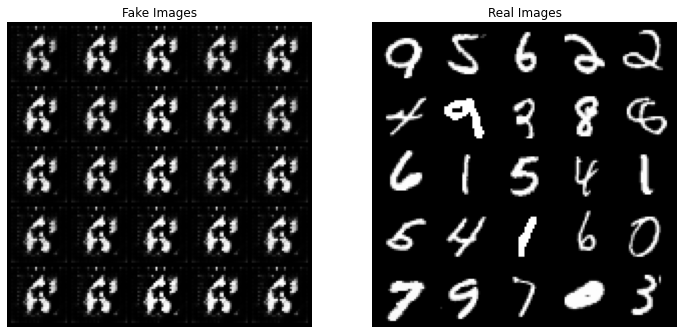

  0%|          | 0/938 [00:00<?, ?it/s]

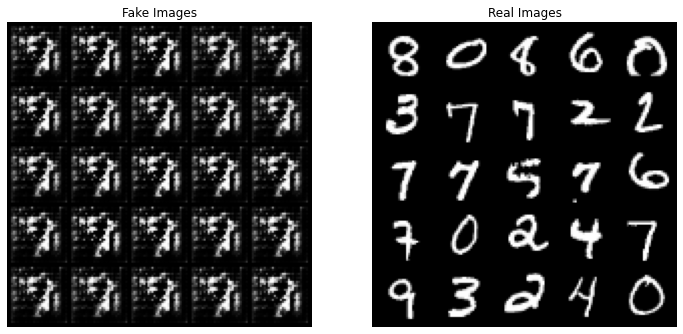

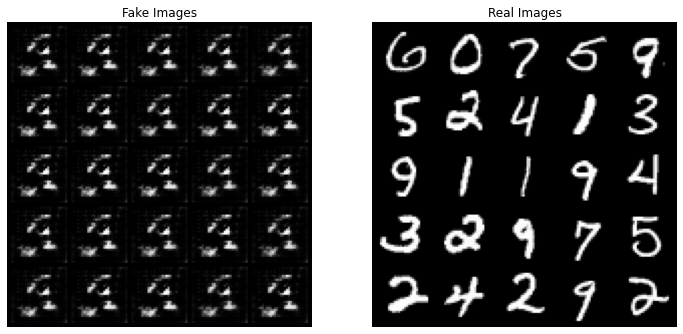

  0%|          | 0/938 [00:00<?, ?it/s]

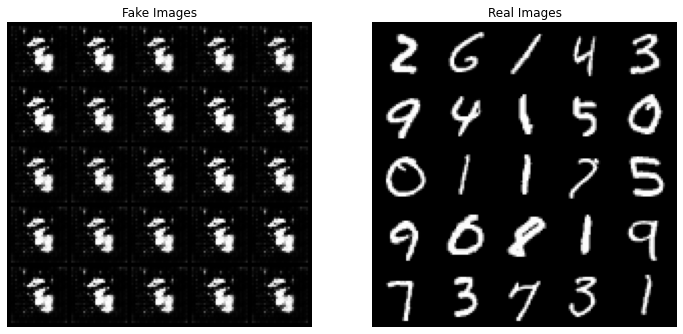

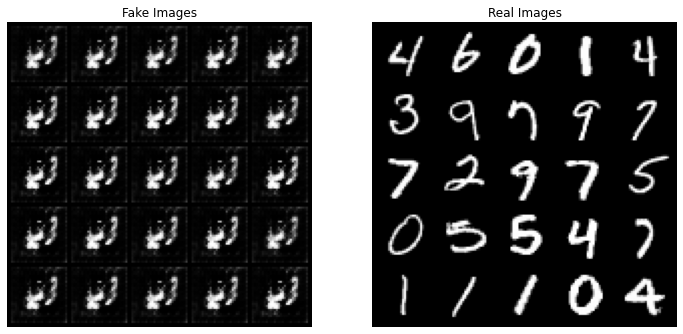

  0%|          | 0/938 [00:00<?, ?it/s]

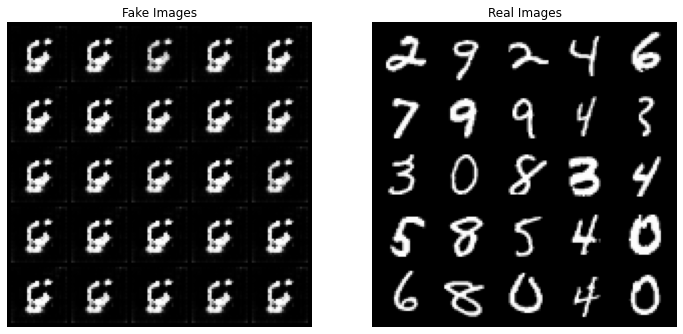

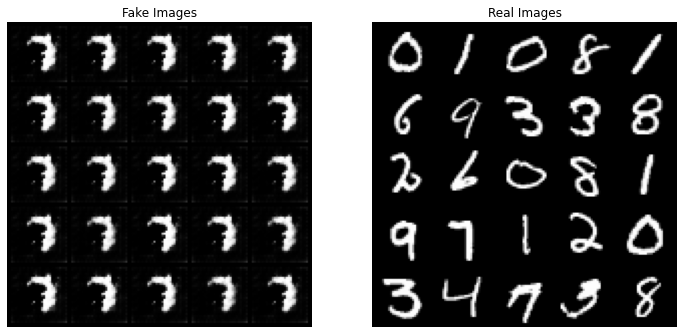

  0%|          | 0/938 [00:00<?, ?it/s]

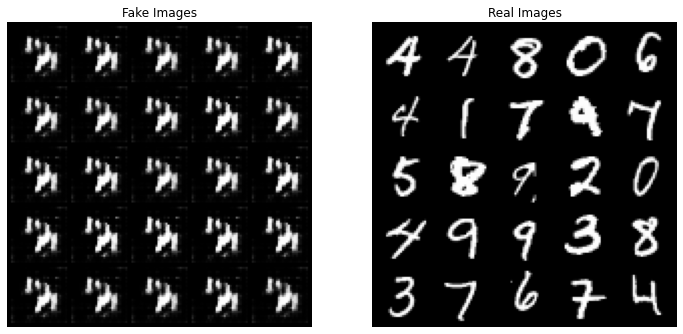

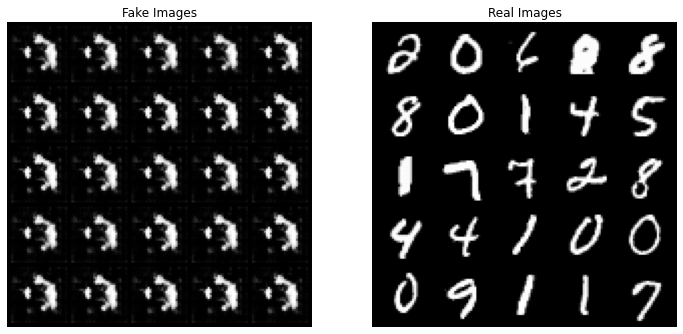

  0%|          | 0/938 [00:00<?, ?it/s]

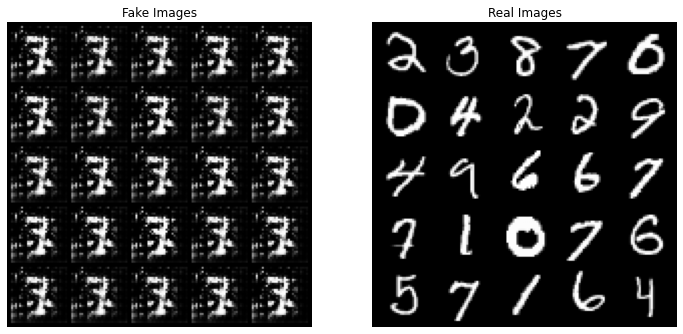

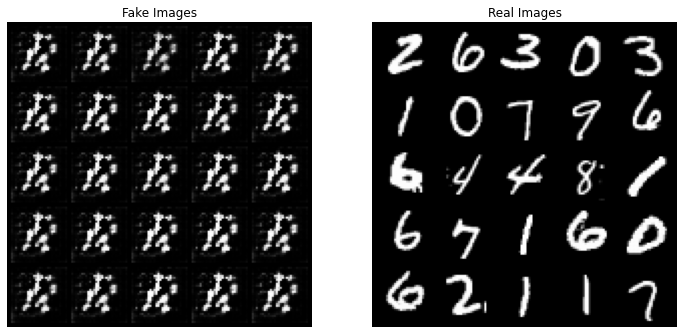

  0%|          | 0/938 [00:00<?, ?it/s]

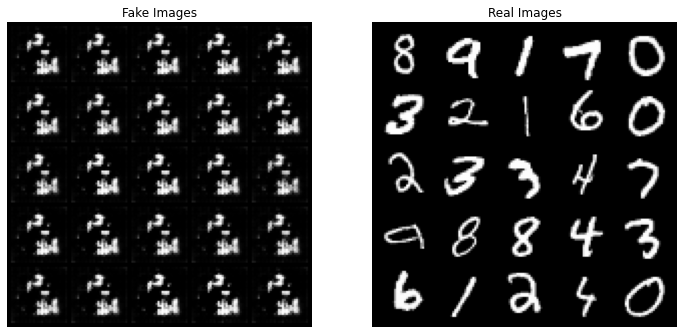

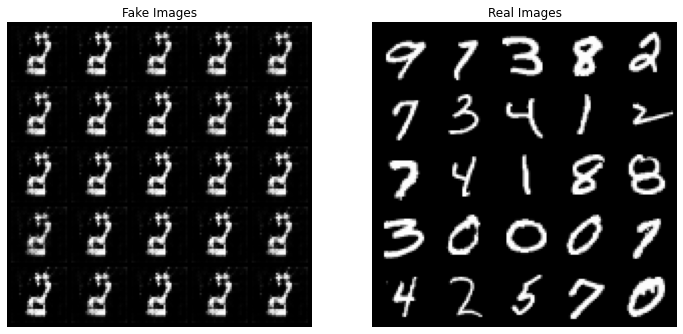

  0%|          | 0/938 [00:00<?, ?it/s]

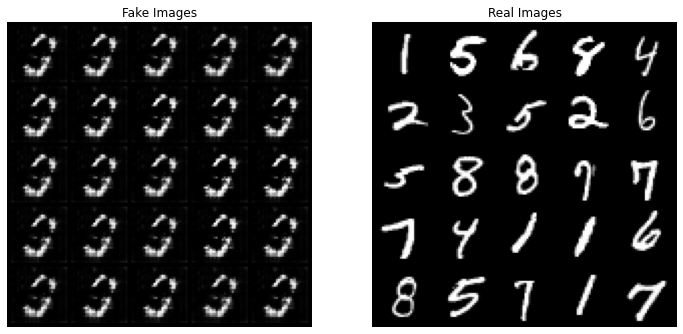

  0%|          | 0/938 [00:00<?, ?it/s]

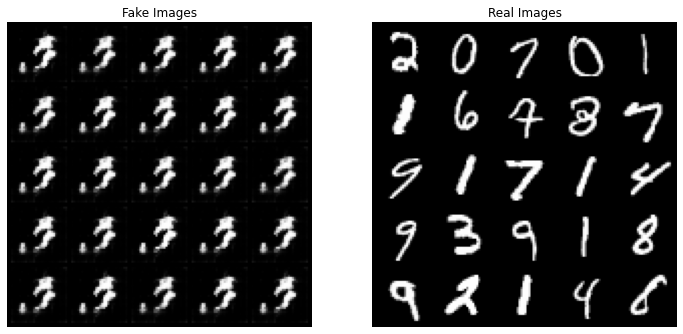

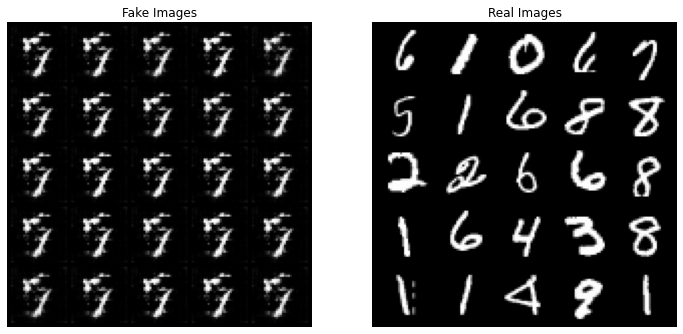

  0%|          | 0/938 [00:00<?, ?it/s]

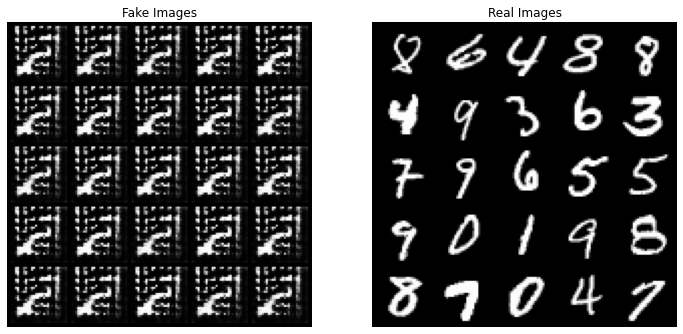

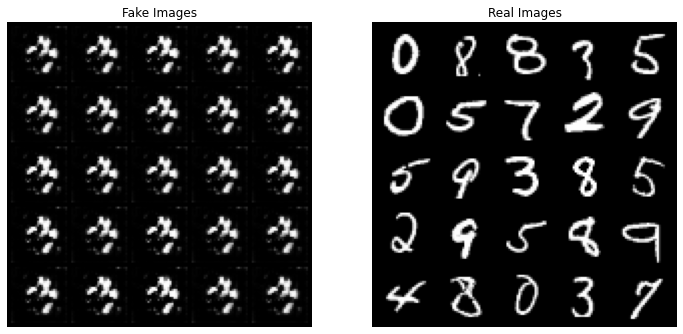

  0%|          | 0/938 [00:00<?, ?it/s]

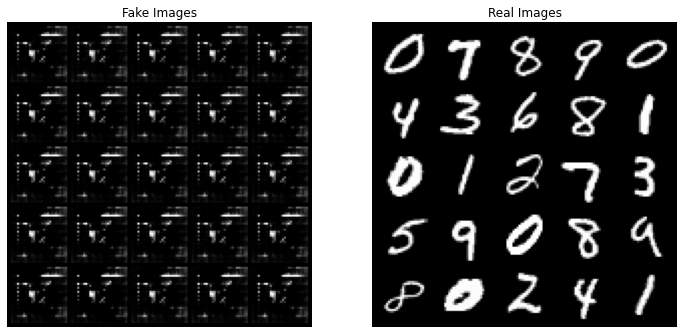

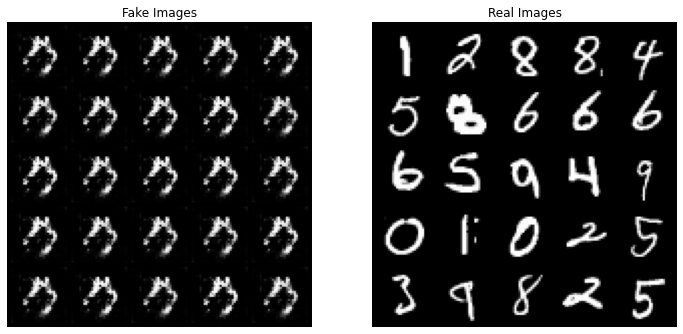

  0%|          | 0/938 [00:00<?, ?it/s]

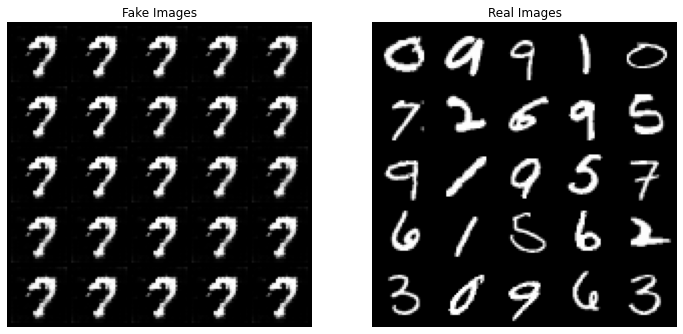

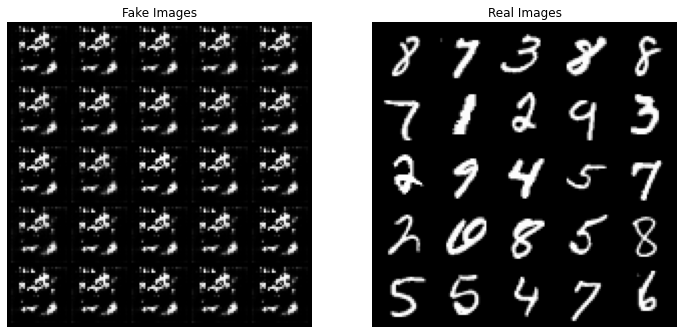

  0%|          | 0/938 [00:00<?, ?it/s]

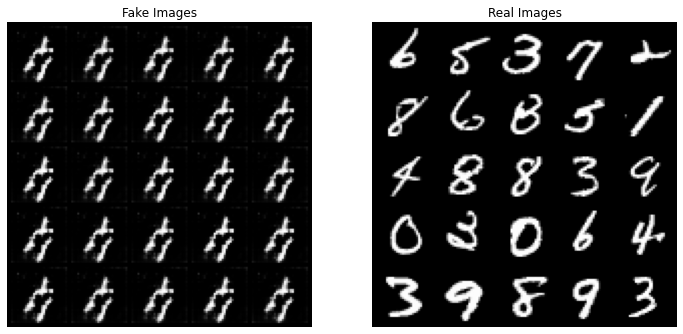

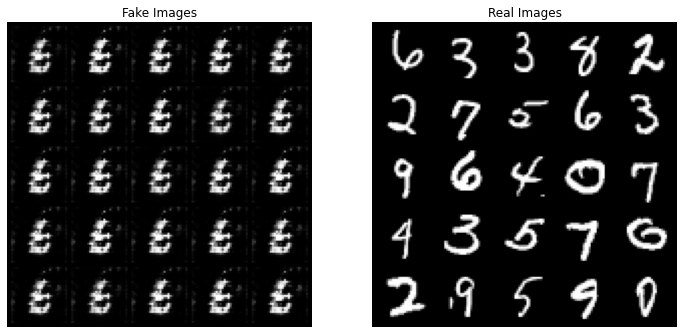

  0%|          | 0/938 [00:00<?, ?it/s]

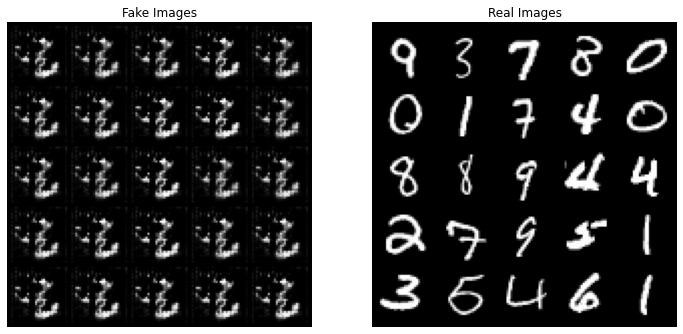

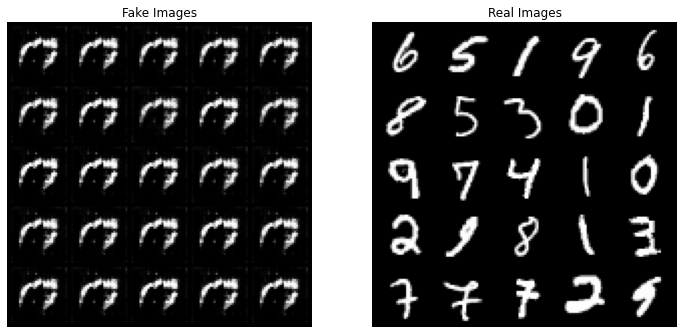

  0%|          | 0/938 [00:00<?, ?it/s]

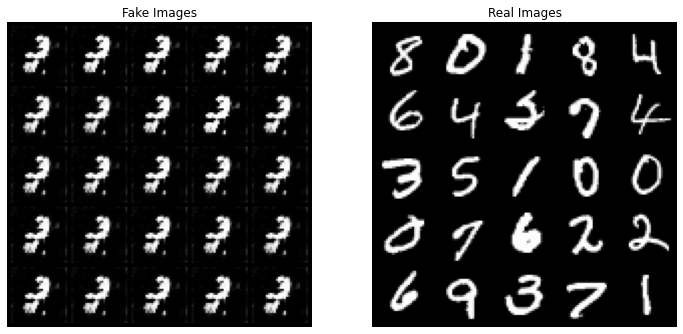

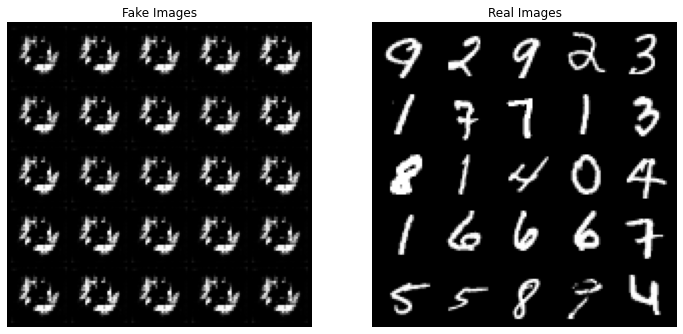

  0%|          | 0/938 [00:00<?, ?it/s]

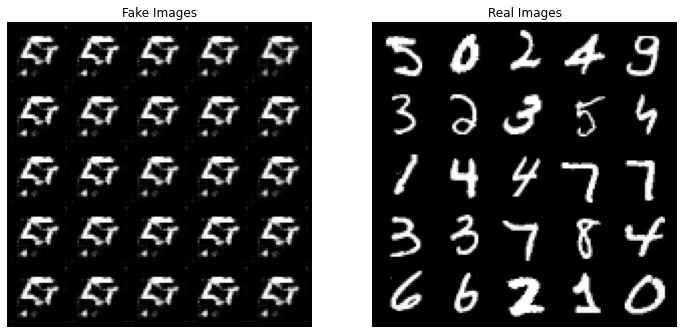

  0%|          | 0/938 [00:00<?, ?it/s]

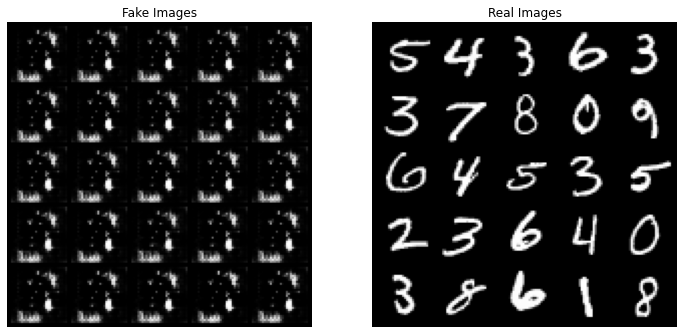

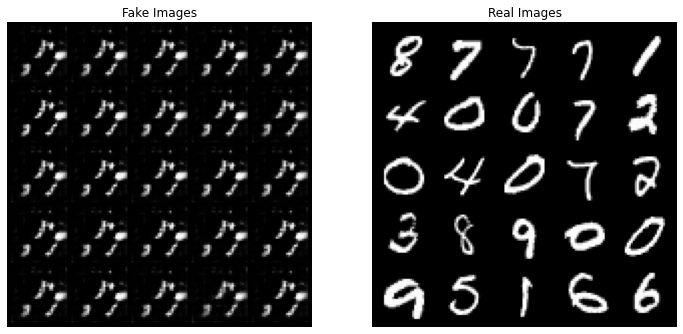

  0%|          | 0/938 [00:00<?, ?it/s]

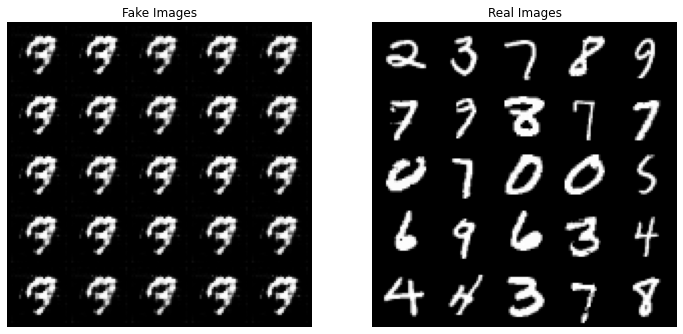

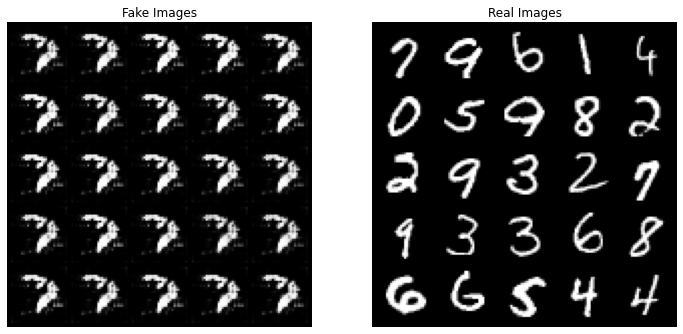

  0%|          | 0/938 [00:00<?, ?it/s]

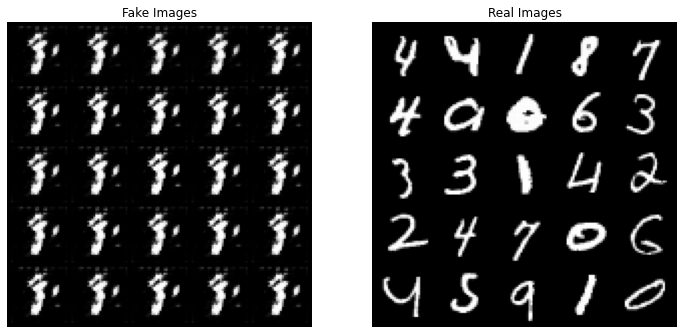

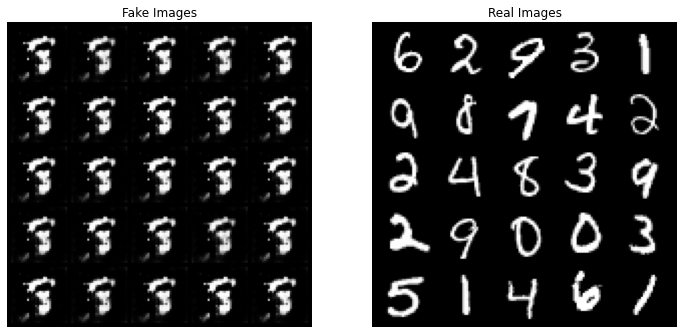

  0%|          | 0/938 [00:00<?, ?it/s]

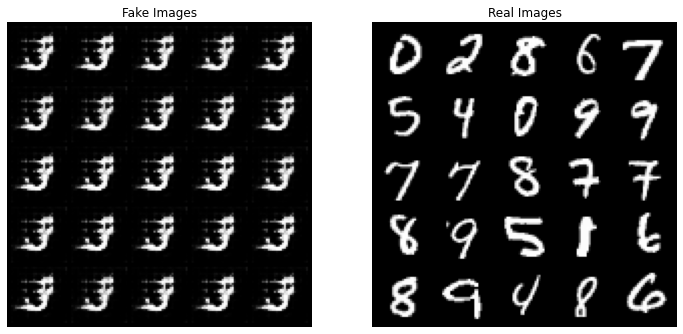

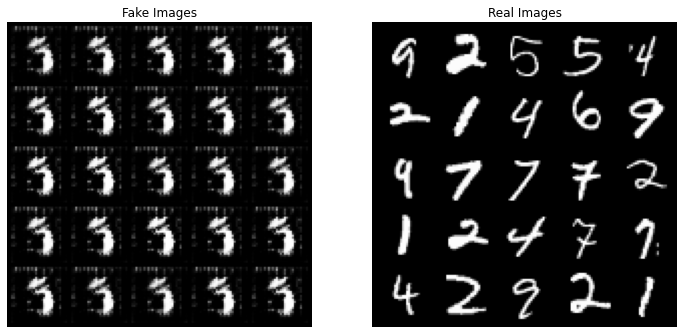

  0%|          | 0/938 [00:00<?, ?it/s]

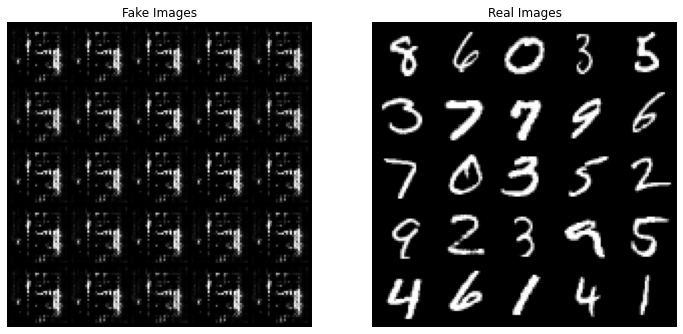

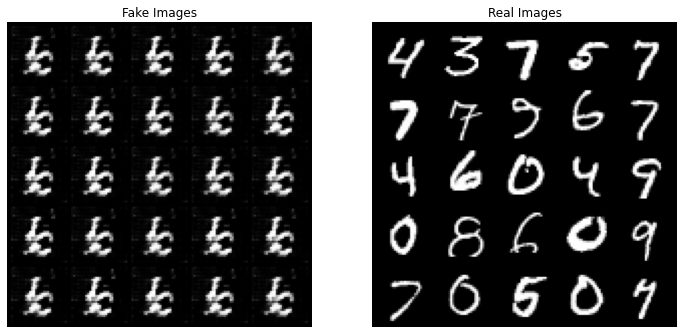

  0%|          | 0/938 [00:00<?, ?it/s]

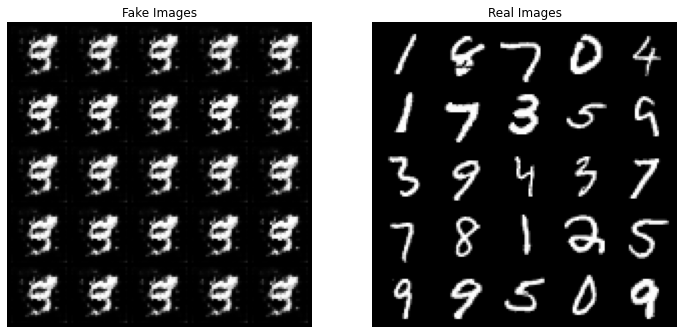

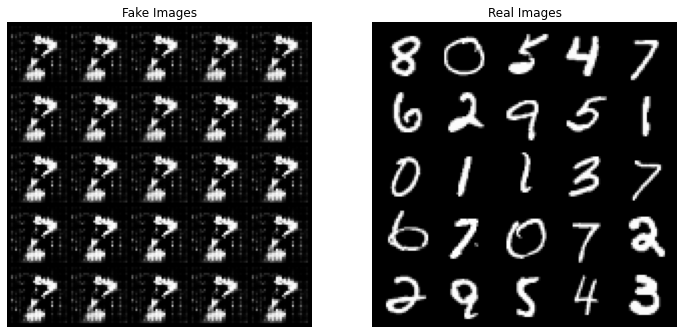

  0%|          | 0/938 [00:00<?, ?it/s]

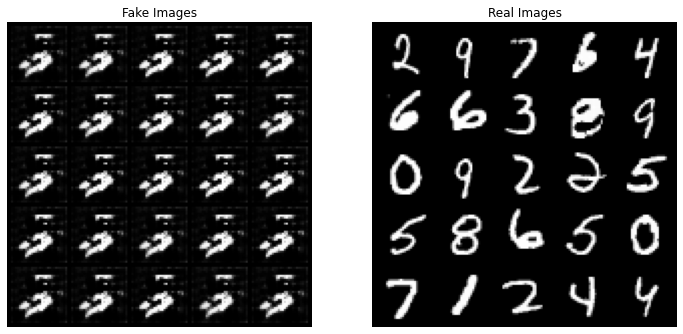

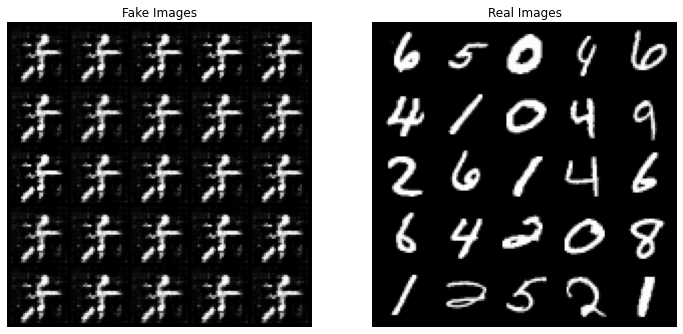

  0%|          | 0/938 [00:00<?, ?it/s]

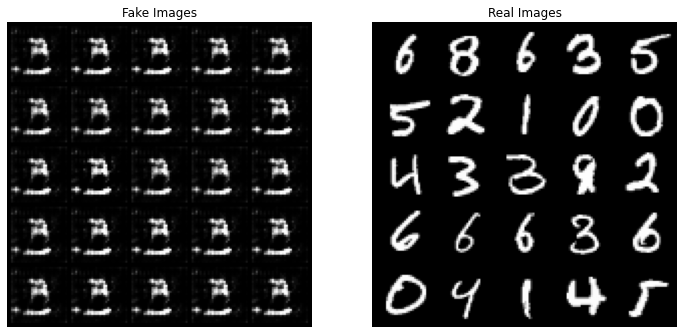

  0%|          | 0/938 [00:00<?, ?it/s]

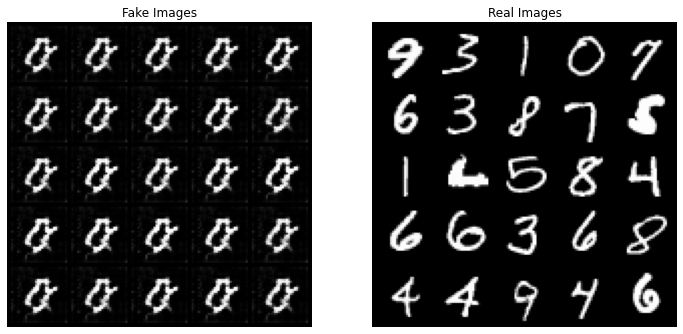

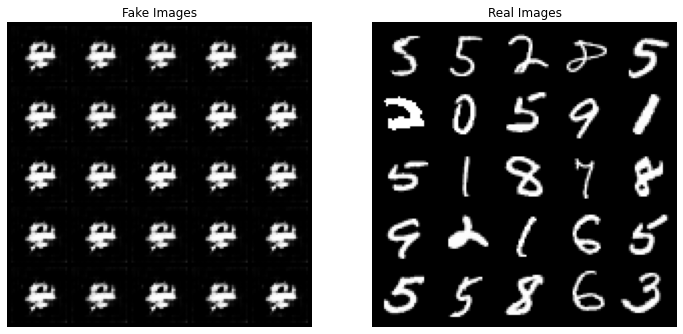

  0%|          | 0/938 [00:00<?, ?it/s]

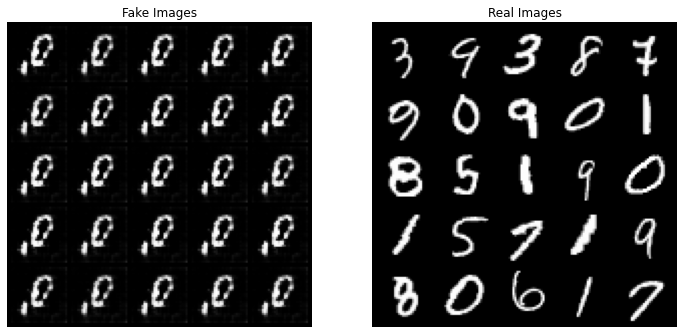

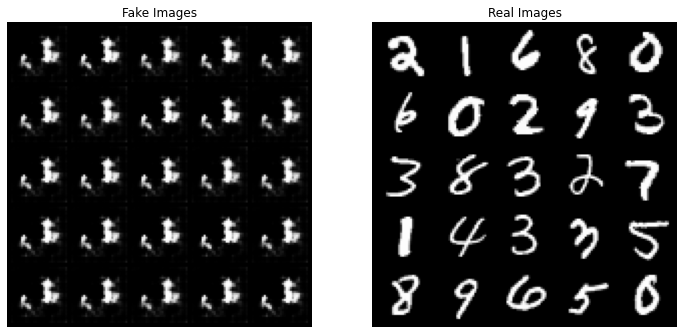

  0%|          | 0/938 [00:00<?, ?it/s]

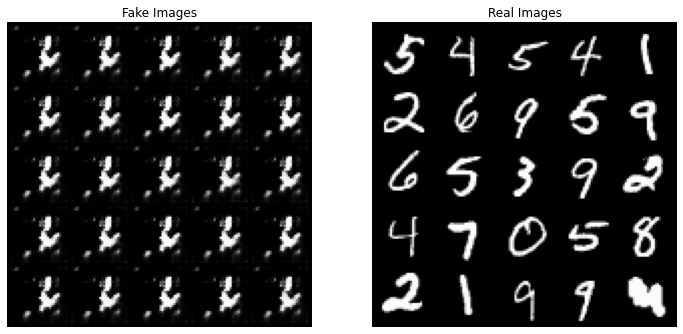

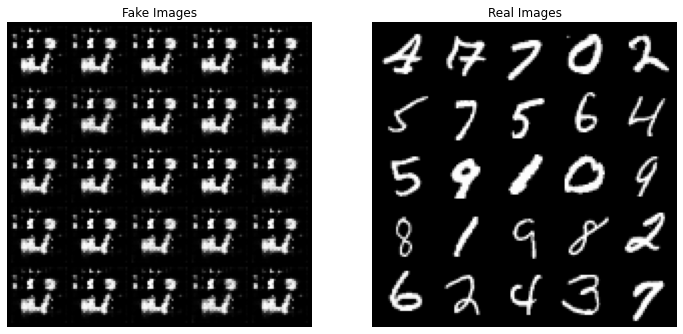

  0%|          | 0/938 [00:00<?, ?it/s]

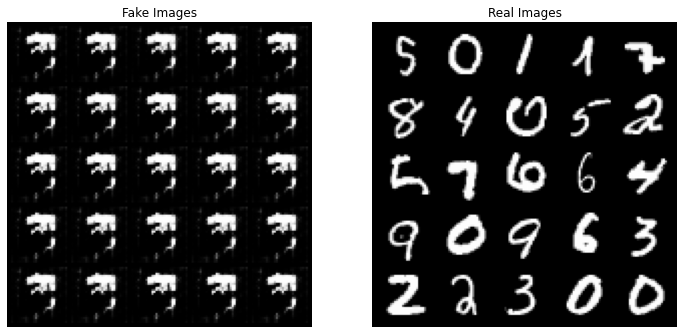

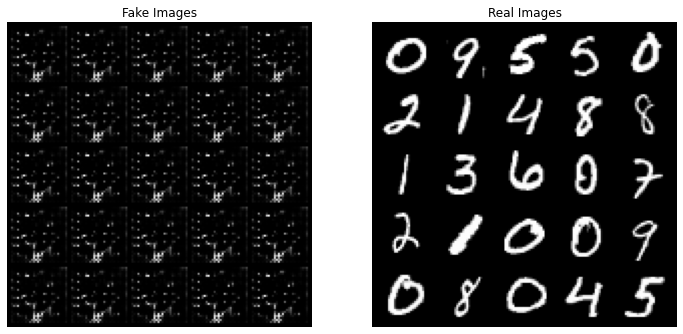

  0%|          | 0/938 [00:00<?, ?it/s]

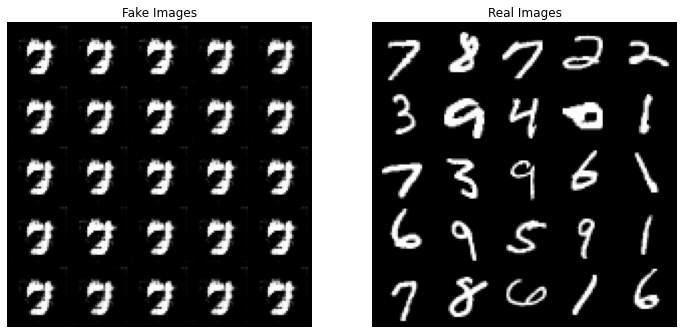

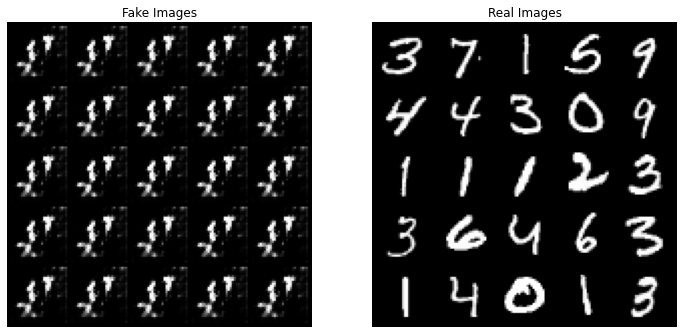

  0%|          | 0/938 [00:00<?, ?it/s]

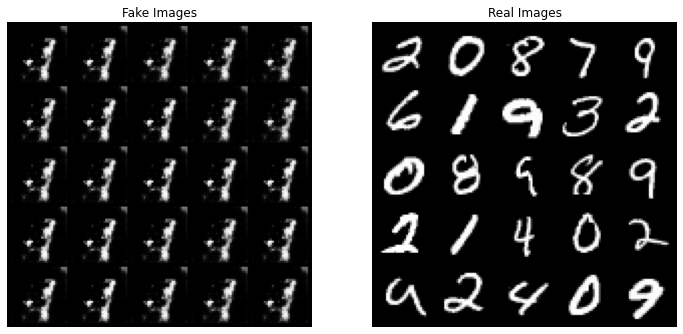

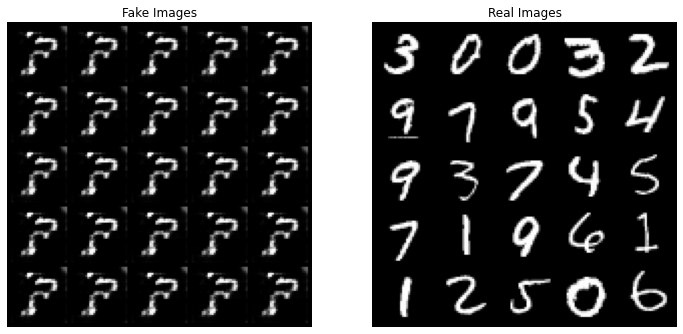

  0%|          | 0/938 [00:00<?, ?it/s]

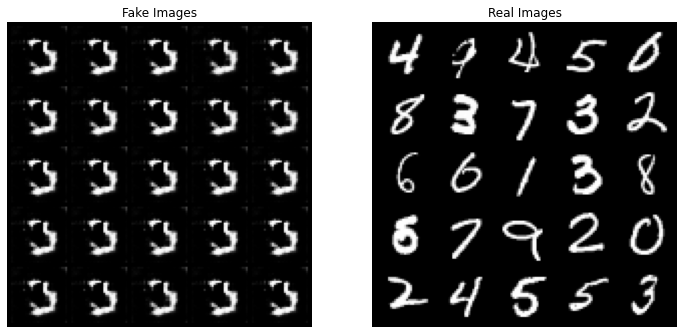

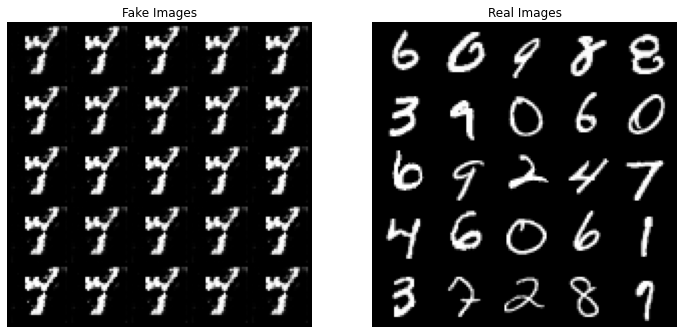

  0%|          | 0/938 [00:00<?, ?it/s]

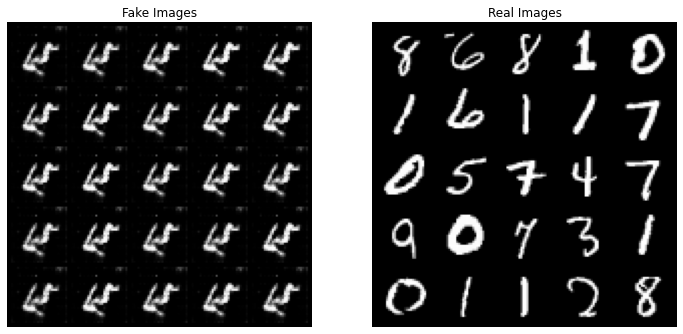

  0%|          | 0/938 [00:00<?, ?it/s]

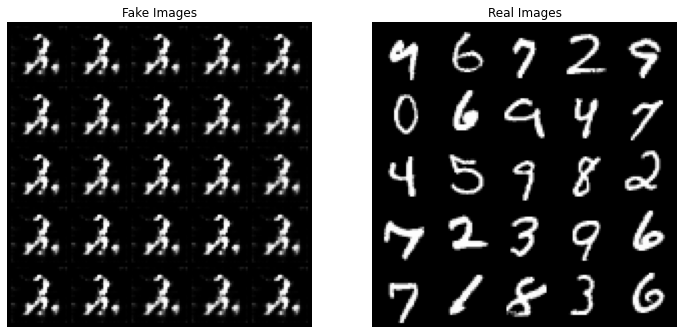

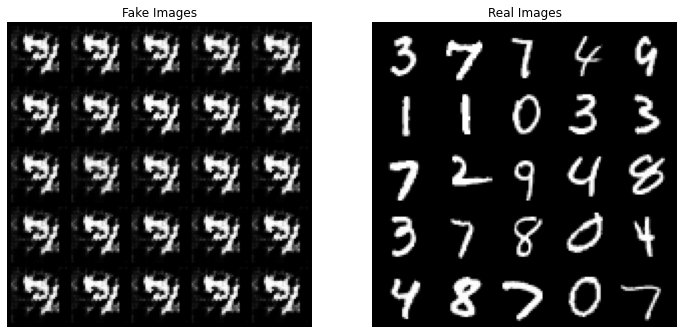

In [ ]:
train(
    generator, discriminator, 50, dataloader, 
    criterion, disc_opt, gen_opt, z_dim,
)